In [1]:
%pylab inline
import stmpy
import stmpy.tools as st
import stmpy.driftcorr as dfc
import h5py

from spgl1 import spgl1, spg_lasso, spg_bp, spg_bpdn, spg_mmv
from scipy.sparse.linalg import LinearOperator

pylab.style.use('Thin')

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
def find_pts(x1, x2):
    x = lambda y: (y-x1[1])/((x2[1]-x1[1])/(x2[0]-x1[0])) + x1[0]
    return x

def get_snr(fts, n, pt0, pt1, range_signal, range_noise, ):
    cuts = []
    snr = []
    for i in range(n):
        r1, cut1 = stmpy.tools.linecut(fts[i], p0=pt0, p1=pt1, width=1, show=True, ax=gca())
        cuts.append(cut1)
        signal = mean(cut1[range_signal])
        noise = mean(cut1[range_noise])
        snr.append(signal / noise)
    return cuts, snr

# Simulation to show the sparse sampling + drift correction

## BSCCO map for simulation

In [9]:
# This dataset is the ground truth (full grid map) for the 250 x 250 dataset
d1_true = stmpy.load("data/Grid Spectroscopy-BSCCO-2022-09-04-002.3ds", biasOffset=False, niceUnits=False)
shape(d1_true.LIY)
d1_true.fft = stmpy.tools.fft(stmpy.tools.nsigma_local(d1_true.LIY), zeroDC=True)

File import successful.


In [172]:
d1_true.header

{'Grid dim': '"250 x 250"',
 'Grid settings': '-5.040688E-8;-5.187596E-8;4.000000E-8;4.000000E-8;2.572162E+1',
 'Filetype': 'Linear',
 'Sweep Signal': '"Bias (V)"',
 'Fixed parameters': '"Sweep Start;Sweep End"',
 'Experiment parameters': '"X (m);Y (m);Z (m);Z offset (m);Settling time (s);Integration time (s);Z-Ctrl hold;Final Z (m);Scan:Current (A);Scan:Z (m)"',
 '# Parameters (4 byte)': '12',
 'Experiment size (bytes)': '192',
 'Points': '12',
 'Channels': '"Current (A);Bias (V);LI Demod 1 X (A);LI Demod 1 Y (A)"',
 'Delay before measuring (s)': '10.000000E-3',
 'Experiment': '"Grid Spectroscopy"',
 'Start time': '"04.09.2022 23:41:48"',
 'End time': '"05.09.2022 14:26:00"',
 'User': '',
 'Comment': '"BSCCO, 100mV/70pA,  2.5 mV excit, 22 mV to -22 mv with 12 pts, 40x40 nm with 250x250 pts"',
 'Bias>Bias (V)': '100E-3',
 'Bias>Calibration (V/V)': '1E+0',
 'Bias>Offset (V)': '-1.4E-3',
 'Bias Spectroscopy>Sweep Start (V)': '22E-3',
 'Bias Spectroscopy>Sweep End (V)': '-22E-3',
 'Bias S

In [4]:
print(d1_true.en)
d1_true.en[8]

[ 0.022  0.018  0.014  0.01   0.006  0.002 -0.002 -0.006 -0.01  -0.014
 -0.018 -0.022]


-0.009999999945813957

In [8]:
mean(d1_true.LIY)

0.20392304956260623

3.720478315652154e-13


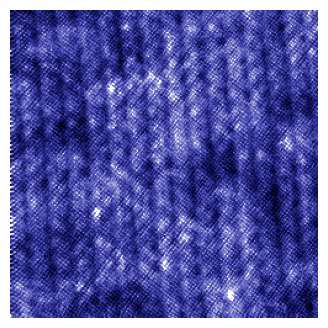

In [10]:
test = copy(d1_true.LIY[-1])*1e15
# test = test * np.bartlett(250)[:, None] * np.bartlett(250)[None, :]
dfc.quick_plot(test)

print(6*std(test)*1e-15)

In [11]:
ri_temp = loadtxt('data/mask_250x250.txt')
ri = array([int(k)-1 for k in ri_temp])

In [12]:
nx = 250
ny = 250

class partialFourier(LinearOperator):
    def __init__(self, idx, n):
        self.idx = idx
        self.n = n
        self.shape = (len(idx), n)
        self.dtype = np.complex128
    def _matvec(self, x): 
        # % y = P(idx) * FFT(x)
        z = np.fft.fft(x) / np.sqrt(n)
        return z[idx]
    def _rmatvec(self, x): 
        z = np.zeros(n,dtype=complex)
        z[idx] = x
        return np.fft.ifft(z) * np.sqrt(n)
n = nx * ny
    
# % Create partial Fourier operator with rows idx
idx=ri
opA = partialFourier(idx=ri, n=n)


In [13]:
b = test.flat[ri]

### BP method


SPGL1
No. rows              :    15625     
No. columns           :    62500

Initial tau           : 0.00e+00     
Two-norm of b         : 8.38e+04

Optimality tol        : 1.00e-04     
Target objective      : 0.00e+00

Basis pursuit tol     : 1.00e-06     
Maximum iterations    :   156250

iterr      Objective   Relative Gap  Rel Error      gnorm   stepg   nnz_x   nnz_g     tau

    0  8.3796842e+04  0.0000000e+00   1.00e+00  4.172e+04     0.0       0       0  1.6830938e+05
    1  7.2099072e+04  1.9977083e+00   1.00e+00  3.585e+04    -0.6    3353       1               
    2  1.8675826e+04  1.7563038e+00   1.00e+00  8.471e+03     0.0      29       1               
    3  7.6422400e+03  1.0852272e-01   1.00e+00  9.025e+02     0.0       9       1               
    4  7.4998393e+03  5.8332737e-02   1.00e+00  5.031e+02     0.0       5       0               
    5  7.4997129e+03  1.2771031e-02   1.00e+00  4.937e+02     0.0       5       0  2.8222991e+05
    6  5.2193003e+03  1.5915627e

  650  3.2732984e-04  2.5575728e-01   3.27e-04  1.793e-06     0.0   27823   27795               
  652  8.0284065e-05  3.9460041e-01   8.03e-05  6.565e-07     0.0   27823   27795               

EXIT -- Found a BP solution

Products with A     :    1122        Total time   (secs) :    13.7
Products with A^H   :     653        Project time (secs) :     8.4
Newton iterations   :      12        Mat-vec time (secs) :     2.6
Line search its     :     469        Subspace iterations :       0


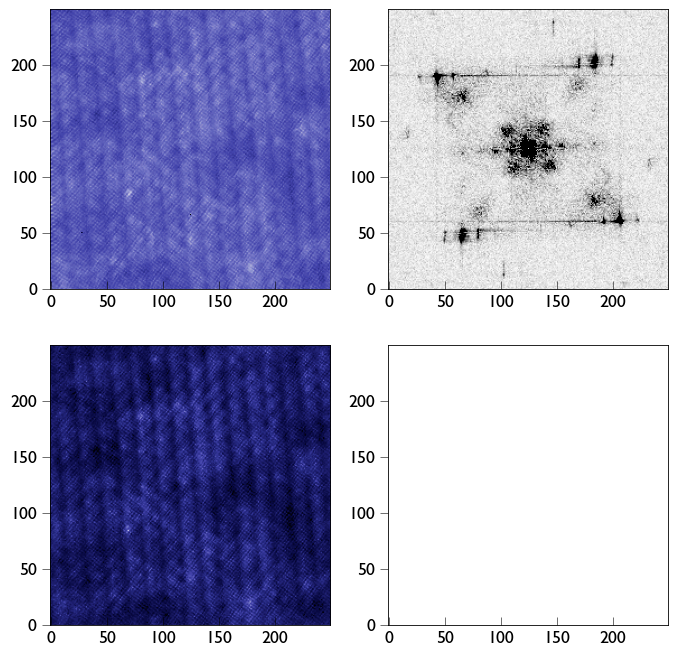

In [14]:
z,resid,grad,info = spg_bp(opA,b, verbosity=2)

# We need to transfer the z back to the real space 
z_topo = real(np.fft.ifft(z).reshape(nx, ny))[::-1,::-1]
dfc.display(test, z_topo*1e-15)

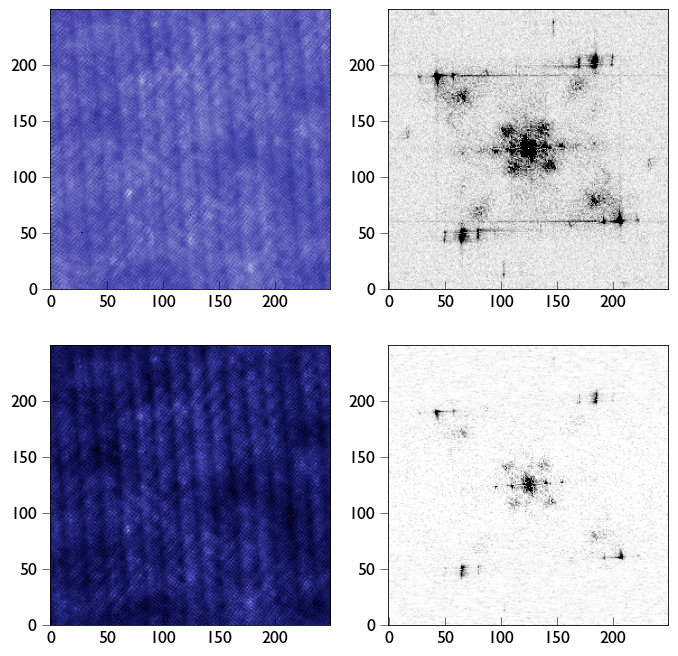

In [15]:
dfc.display(test, z_topo*1e2)

In [19]:
d1_true.i = mean(d1_true.I, axis=(1,2))

In [28]:
print(d1_true.i[0], d1_true.LIY[1,0,0], (diff(d1_true.i)/diff(d1_true.en))[0])

4.9938253366133e-12 8.704147970960141e-13 3.3922459393588947e-10


0.0025956421268100017


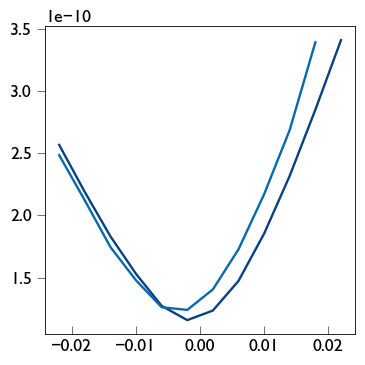

In [33]:
plot(d1_true.en, d1_true.didv/0.0025956421268100017)
plot(d1_true.en[1:], diff(d1_true.i)/diff(d1_true.en))

print(np.mean(d1_true.didv / np.mean(diff(d1_true.i)/diff(d1_true.en))))

factor = 1 / 0.0025956421268100017 * 1e9

In [35]:
print(std(test)*6e-15*factor, d1_true.en[-1])

0.14333556530092828 -0.02199999988079071


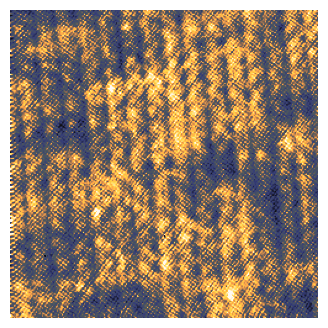

In [36]:
dfc.quick_plot(test, cmap=stmpy.cm.jackyPSD, imgName='LIY at -22 mv with 0.14 nS span')

In [40]:
print(std(st.fft(test, zeroDC=True))*5e-15*factor, d1_true.en[-1])

25.326948136222732 -0.02199999988079071


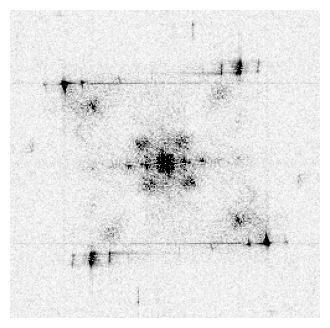

In [41]:
dfc.quick_plot(st.fft(test, zeroDC=True), rspace=False, thres=5,
               cmap=stmpy.cm.gray_r, imgName='LIY ft at -22 mv with 25.33 nS span')

#### Square residual metrics

The coordinates of the Bragg peaks are:
array([[207,  60],
       [ 43, 190],
       [ 65,  45],
       [185, 205]])

The coordinates of the Q vectors are:
array([[ 83, -64],
       [-81,  66],
       [-59, -79],
       [ 61,  81]])


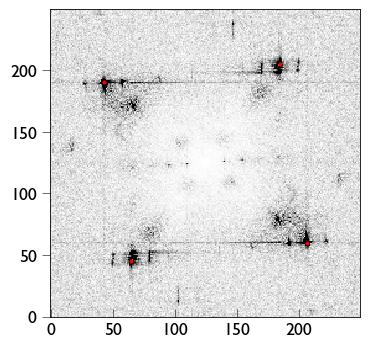

In [42]:
bp = dfc.findBraggs(test, r=0.2, min_dist=20, show=True)

In [44]:
print(std(mask * st.fft(test, zeroDC=True))*5e-15*factor)

21.894050577263247


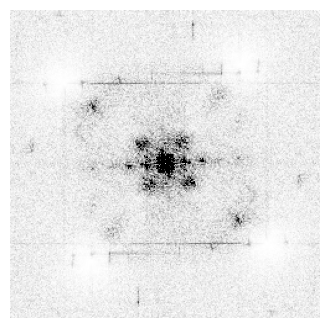

In [45]:
x = arange(nx)
width = 20
g = 0

for i in range(len(bp)):
    x0, y0 = bp[i]
    g += st.gauss2d(x, x, p=[x0, y0, width*4, width, 1, 0]) * st.gauss2d(x, x, p=[x0, y0, width, width*4, 1, 0])

mask = 1-g

dfc.quick_plot(mask * st.fft(test, zeroDC=True), rspace=False, thres=5,
               imgName='LIY ft after masking at -22 mv with 22 nS span')


In [46]:
test_ft = st.fft(test, zeroDC=True)
test_ft_masked = test_ft * mask

rec_ft = st.fft(z_topo, zeroDC=True)
rec_ft_masked = rec_ft * mask

In [48]:
print(std(rec_ft_masked)*3e-15*factor)

0.047369024396413606


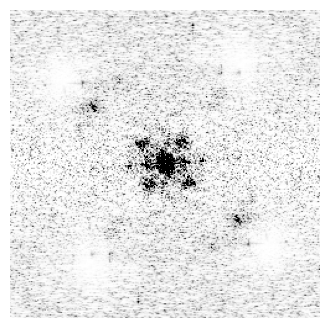

In [49]:

dfc.quick_plot(rec_ft_masked, rspace=False, imgName="LIY rec ft after masking at -22 mv with 0.05 nS span")

In [51]:
print(sum(test_ft_masked), sum(rec_ft_masked))
test_ft_l1 = test_ft_masked * 1
rec_ft_l1 = rec_ft_masked * sum(test_ft_masked) / sum(rec_ft_masked)

print(std(test_ft_l1 - rec_ft_l1)*3e-15*factor)

413505801.19467264 964577.9596277685
10.937262477736867


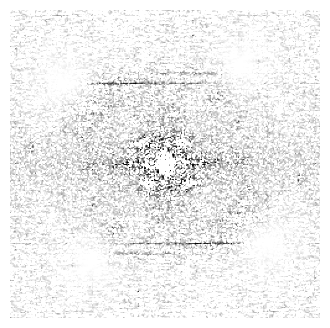

In [52]:
dfc.quick_plot(test_ft_l1 - rec_ft_l1, rspace=False, 
               imgName="LIY residual ft after masking at -22 mv with 11 nS span")

#### test the dependence on the cutoff


In [53]:
cutoffs = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2]

test_rec = []

for i in range(len(cutoffs)):
    z,resid,grad,info = spg_bp(opA,b, verbosity=cutoffs[i])

    # We need to transfer the z back to the real space 
    z_topo = real(np.fft.ifft(z).reshape(nx, ny))[::-1,::-1]
    test_rec.append(z_topo)
#     dfc.display(test, z_topo*1e-15)


SPGL1
No. rows              :    15625     
No. columns           :    62500

Initial tau           : 0.00e+00     
Two-norm of b         : 8.38e+04

Optimality tol        : 1.00e-04     
Target objective      : 0.00e+00

Basis pursuit tol     : 1.00e-06     
Maximum iterations    :   156250


EXIT -- Found a BP solution

Products with A     :    1122        Total time   (secs) :    12.7
Products with A^H   :     653        Project time (secs) :     8.0
Newton iterations   :      12        Mat-vec time (secs) :     2.4
Line search its     :     469        Subspace iterations :       0

SPGL1
No. rows              :    15625     
No. columns           :    62500

Initial tau           : 0.00e+00     
Two-norm of b         : 8.38e+04

Optimality tol        : 1.00e-04     
Target objective      : 0.00e+00

Basis pursuit tol     : 1.00e-06     
Maximum iterations    :   156250

iterr      Objective   Relative Gap  Rel Error      gnorm   stepg   nnz_x   nnz_g     tau

    0  8.3796842e+04 

  570  1.6200645e-03  5.7108805e-01   1.62e-03  8.412e-06     0.0   27827   27797               
  580  1.5987093e-03  5.2563784e-01   1.60e-03  8.293e-06     0.0   27827   27795               
  590  1.5871739e-03  5.0998496e-01   1.59e-03  8.209e-06     0.0   27827   27795               
  600  1.5676314e-03  5.1967751e-01   1.57e-03  8.122e-06     0.0   27825   27795               
  610  1.5576907e-03  8.5888252e-01   1.56e-03  8.323e-06     0.0   27825   27795               
  620  1.5237379e-03  9.8113712e-01   1.52e-03  8.265e-06     0.0   27823   27795               
  630  1.5101777e-03  2.3872862e+00   1.51e-03  9.485e-06    -1.5   27819   27795               
  640  3.4119579e-04  6.5215364e-01   3.41e-04  2.217e-06    -0.6   27823   27795               
  650  3.2732984e-04  2.5575728e-01   3.27e-04  1.793e-06     0.0   27823   27795               
  652  8.0284065e-05  3.9460041e-01   8.03e-05  6.565e-07     0.0   27823   27795               

EXIT -- Found a BP solution



  510  1.4449424e-02  1.9001793e+01   1.44e-02  8.666e-05    -1.5   27869   27817               
  520  1.3944230e-02  1.1431967e+01   1.39e-02  7.796e-05    -0.3   27825   27795  1.1256555e+06
  530  1.8611680e-03  1.8393657e+00   1.86e-03  1.042e-05     0.0   27827   27797               
  540  1.7247433e-03  1.0042866e+00   1.72e-03  9.165e-06     0.0   27827   27797               
  550  1.6803009e-03  8.6486270e-01   1.68e-03  8.875e-06     0.0   27827   27797               
  560  1.6448345e-03  5.8751392e-01   1.64e-03  8.536e-06     0.0   27827   27797               
  570  1.6200645e-03  5.7108805e-01   1.62e-03  8.412e-06     0.0   27827   27797               
  580  1.5987093e-03  5.2563784e-01   1.60e-03  8.293e-06     0.0   27827   27795               
  590  1.5871739e-03  5.0998496e-01   1.59e-03  8.209e-06     0.0   27827   27795               
  600  1.5676314e-03  5.1967751e-01   1.57e-03  8.122e-06     0.0   27825   27795               
  610  1.5576907e-03  8.588825

In [54]:
residuals = []
rec_ft = []

for i in range(len(cutoffs)):
    temp = st.fft(test_rec[i], zeroDC=True)
    rec_ft.append(temp)
    rec_ft_masked = temp * mask
    rec_ft_l1 = rec_ft_masked * sum(test_ft_masked) / sum(rec_ft_masked)
    residuals.append(np.sum((rec_ft_l1-test_ft_l1)**2))

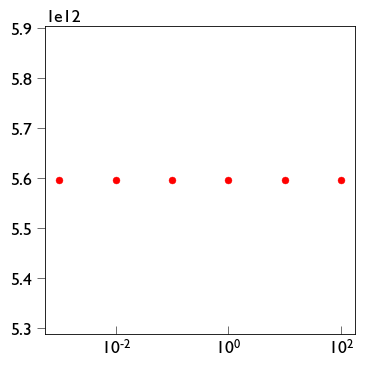

In [55]:
plot(cutoffs, residuals, 'ro')
xscale('log')

In [56]:
print(residuals)

[5596859507020.264, 5596859507020.264, 5596859507020.264, 5596859507020.264, 5596859507020.264, 5596859507020.264]


#### Signal to noise ratio

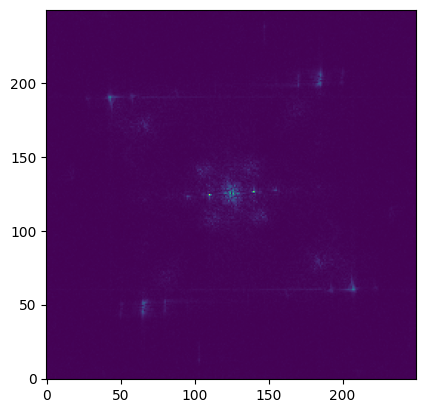

In [49]:
imshow(test_ft, origin='lower')

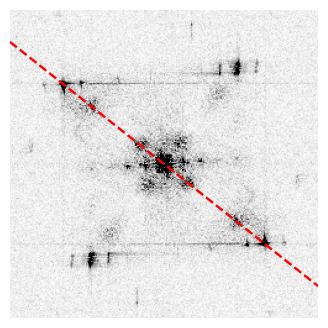

In [61]:
to_plot = test_ft
f = find_pts(bp[0][::-1], bp[1][::-1])

pt1 = [0, f(0)]
pt2 = [shape(to_plot)[-1], f(shape(to_plot)[-1])]

c2 = mean(to_plot)
s2 = std(to_plot)
imshow(to_plot,cmap=stmpy.cm.gray_r, origin='lower', clim=[0, c2+5*s2])
r0, cut0 = stmpy.tools.linecut(to_plot, p0=pt1, 
                               p1=pt2, width=1, show=True, ax=gca(), color='r')
xlim(0,250)
ylim(0,250)
axis('off')

gca().set_aspect(1)
savefig('snr linecut scheme.png', dpi=400, bbox_inches='tight', pad_inches=0)

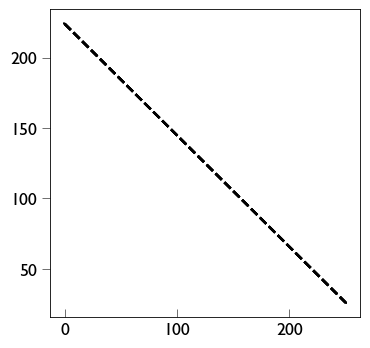

In [62]:
cuts = []
for i in range(len(cutoffs)):
    r1, cut1 = stmpy.tools.linecut(rec_ft[i], p0=pt1, 
                               p1=pt2, width=1, show=True, ax=gca())
    cuts.append(cut1)

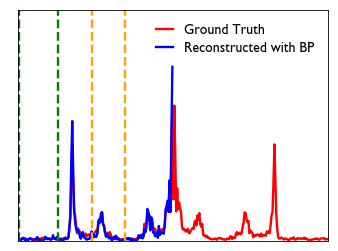

In [79]:
figure(figsize=[4,3])
plot(cut0 * 1e-5, 'r', label='Ground Truth')
plot(cuts[0][0:len(cut0)//2] * sum(cut0) / sum(cuts[0]) * 1e-5, 'b', label='Reconstructed with BP')
signals = []
noise = []
# for i in range(len(cutoffs)):
#     plot(cuts[i] * sum(cut0) / sum(cuts[i]))
#     signals.append(mean(cuts[i][75:110]))
#     noise.append(mean(cuts[i][:40]))
    
signal0 = mean(cut0[75:110])
noise0 = mean(cut0[:40])
axvline(0, linestyle='--', color='g')
axvline(40, linestyle='--', color='g')
axvline(75, linestyle='--', color='orange')
axvline(110, linestyle='--', color='orange')
xlim(-1, len(cut0))
ylim(0, 6)
xticks([])
yticks([])
legend()

savefig('snr linecut scheme 2.png', dpi=400, bbox_inches='tight', pad_inches=0.1)

In [74]:
print(signal0/noise0, array(signals)/array(noise))

3.9590392608753264 [3.57705498 3.57705498 3.57705498 3.57705498 3.57705498 3.57705498]


In [80]:
def get_snr(fts, n, pt0, pt1, range_signal, range_noise, ):
    cuts = []
    snr = []
    for i in range(n):
        r1, cut1 = stmpy.tools.linecut(fts[i], p0=pt0, p1=pt1, width=1, show=True, ax=gca())
        cuts.append(cut1)
        signal = mean(cut1[range_signal])
        noise = mean(cut1[range_noise])
        snr.append(signal / noise)
    return cuts, snr

## BPDN

### Square residuals

In [297]:
cutoffs_bpdn = [1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 2.5, 5e3, 7.5e3, 1e4, ]

test_rec_bpdn = []

for i in range(len(cutoffs_bpdn)):
    sigma =  cutoffs_bpdn[i]#     % Desired ||Ax - b||_2
    x,resid,grad,info = spg_bpdn(opA, b, sigma, iter_lim=1e5, verbosity=2e-1)
    z_topo = real(np.fft.ifft(x).reshape(nx, ny))[::-1,::-1]
    test_rec_bpdn.append(z_topo)

/Users/richardyuliu/.pyenv/versions/3.9.16/lib/python3.9/site-packages/spgl1/spgl1.py:268: RuntimeWarning: invalid value encountered in divide
  xc /= xa


In [298]:
residuals_bpdn = []
rec_ft_bpdn = []

for i in range(len(cutoffs_bpdn)):
    temp = st.fft(test_rec_bpdn[i], zeroDC=True)
    rec_ft_bpdn.append(temp)
    rec_ft_masked = temp * mask
    rec_ft_l1 = rec_ft_masked * sum(test_ft_masked) / sum(rec_ft_masked)
    residuals_bpdn.append(np.sum((rec_ft_l1-test_ft_l1)**2))

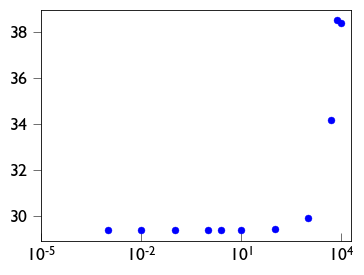

In [301]:
figure(figsize=[4,3])
plot(array(cutoffs_bpdn), log(array(residuals_bpdn)), 'bo')
xscale('log')
# yscale('log')
# axhline()
xlim(1e-5, 2e4)
# ylim(5, 10)

savefig('BPDN residual new.png', dpi=400, bbox_inches='tight', pad_inches=0.1)

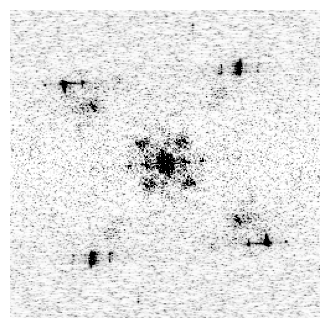

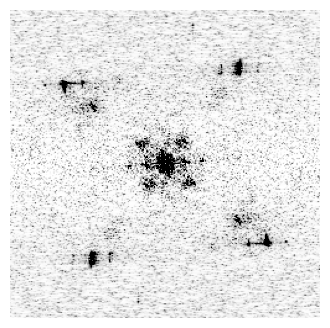

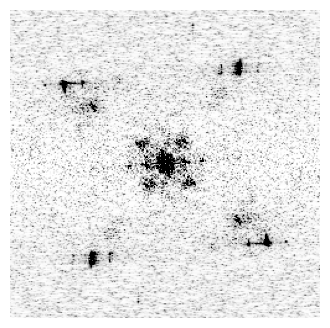

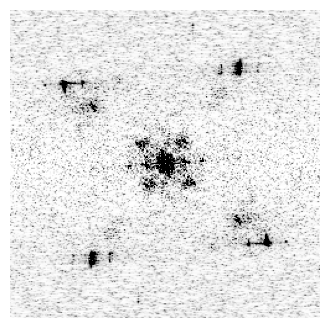

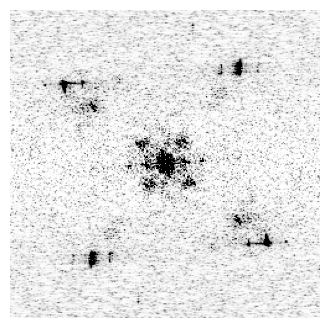

...

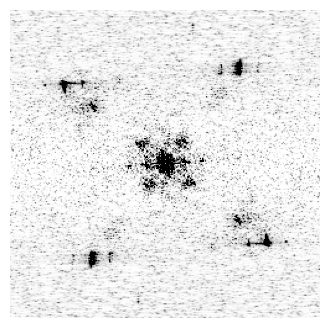

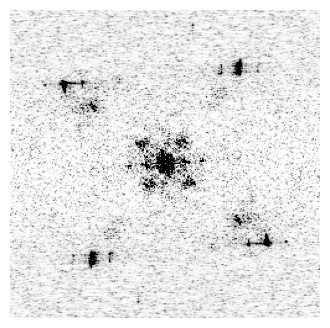

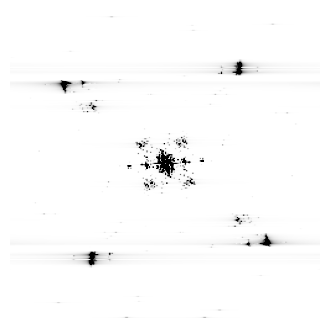

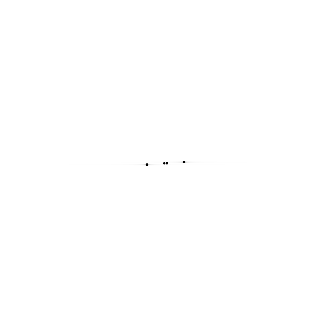

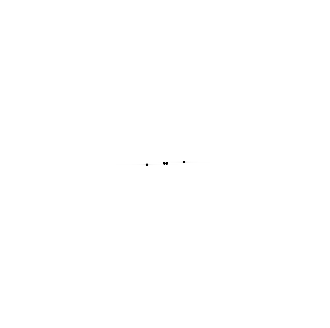

In [303]:
# index = [0, 5, -3, -4, -5, -2, -6]
for i in range(len(cutoffs_bpdn)):
    dfc.quick_plot(rec_ft_bpdn[i], clims=[0, 150], rspace=False, 
                   imgName="bpdn with {}".format(cutoffs_bpdn[i]))

### SNR

In [304]:
def get_snr(fts, n, pt0, pt1, range_signal, range_noise, ):
    cuts = []
    snr = []
    for i in range(n):
        r1, cut1 = stmpy.tools.linecut(fts[i], p0=pt0, p1=pt1, width=1, show=True, ax=gca())
        cuts.append(cut1)
        signal = mean(cut1[range_signal[0]:range_signal[1]])
        noise = mean(cut1[range_noise[0]:range_noise[1]])
        snr.append(signal / noise)
    return cuts, snr

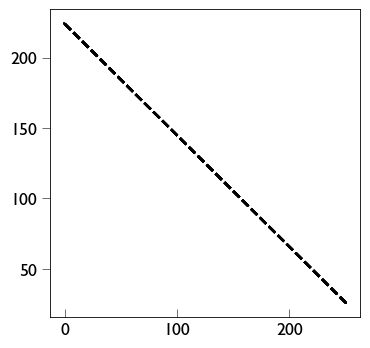

In [314]:
rec_ft_bpdn.append(test_ft)
cuts_bpdn, snr_bpdn =  get_snr(rec_ft_bpdn, len(rec_ft_bpdn), pt0=pt1, pt1=pt2, 
                               range_signal=[75, 110], range_noise=[0, 40], )


In [315]:
snr_bpdn

[3.601193217014497,
 3.596680798992769,
 3.5986223569671645,
 3.6002784059430213,
 3.587542143546075,
 3.6667699514337135,
 4.36534201589104,
 3.595341130514165,
 27.30478175587762,
 1.1113524617979373,
 0.8992305972522664,
 3.9590392608753264]

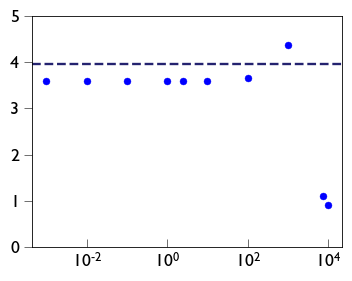

In [317]:
figure(figsize=[4,3])
plot(cutoffs_bpdn, snr_bpdn[:-1], 'bo')
axhline(snr_bpdn[-1], linestyle='--')
xscale('log')
ylim(0, 5)

savefig('BPDN snr comparison.png', dpi=400, bbox_inches='tight', pad_inches=0.1)

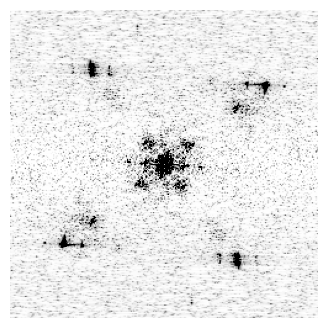

In [112]:
dfc.quick_plot(rec_ft_bpdn[-2], rspace=False)

## LASSO method

In [130]:
# cutoffs_lasso = [1e-4, 1e-3, 1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3, 1e4, 1e5, 1e6, 1e7]
cutoffs_lasso = linspace(1e5, 1.5e6, num=20)
test_rec_lasso = []

for i in range(len(cutoffs_lasso)):
    tau =  cutoffs_lasso[i]#     % Desired ||Ax - b||_2
    x,resid,grad,info = spg_lasso(opA, b, tau, verbosity=1e-1)
#     x,resid,grad,info = spg_bpdn(opA, b, sigma, iter_lim=1e5, verbosity=2e-1)
    z_topo = real(np.fft.ifft(x).reshape(nx, ny))[::-1,::-1]
    test_rec_lasso.append(z_topo)

In [131]:
residuals_lasso = []
rec_ft_lasso = []

for i in range(len(cutoffs_lasso)):
    temp = st.fft(test_rec_lasso[i], zeroDC=True)
    rec_ft_lasso.append(temp)
    rec_ft_masked = temp * mask
    rec_ft_l1 = rec_ft_masked * sum(test_ft_masked) / sum(rec_ft_masked)
    residuals_lasso.append(np.sum((rec_ft_l1-test_ft_l1)**2))

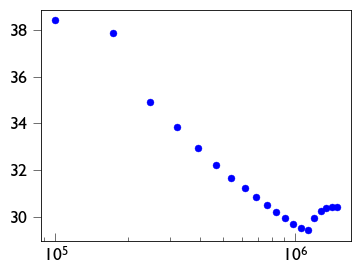

In [318]:
figure(figsize=[4,3])
plot(cutoffs_lasso, log(residuals_lasso), 'bo')
xscale('log')
# yscale('log')
# ylim(1e12, 1e17)

# savefig('LASSO residuals.png',dpi=400, bbox_inches='tight', pad_inches=0.1)


### SNR

/var/folders/hk/6m2xfkl962sdks8gpbvkjtdr0000gn/T/ipykernel_46097/1079357919.py:9: RuntimeWarning: invalid value encountered in scalar divide
  snr.append(signal / noise)


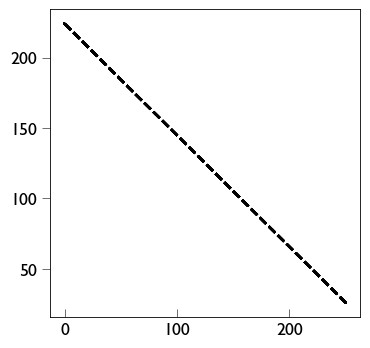

In [134]:
# rec_ft_lasso.append(test_ft)
cuts_lasso, snr_lasso =  get_snr(rec_ft_lasso, len(rec_ft_lasso), pt0=pt1, pt1=pt2, 
                               range_signal=[75, 110], range_noise=[0, 40], )


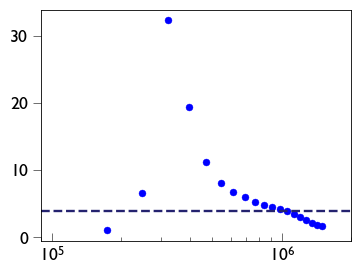

In [321]:
figure(figsize=[4,3])
plot(cutoffs_lasso, snr_lasso[:-1], 'bo')
axhline(snr_lasso[-1], linestyle='--')
xscale('log')
xlim(9e4, 2e6)
savefig('LASSO SNR.png', dpi=400, bbox_inches='tight', pad_inches=0.1)

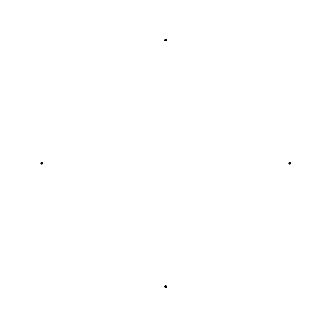

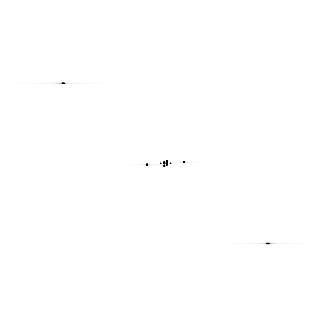

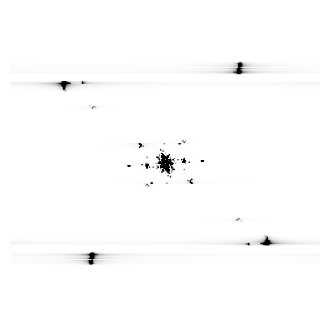

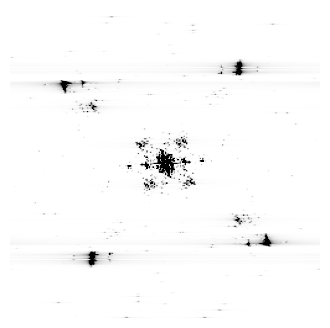

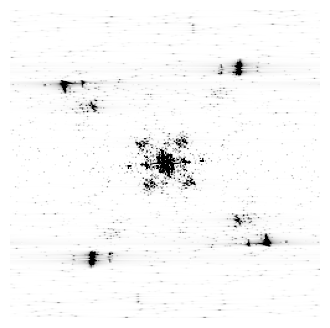

...

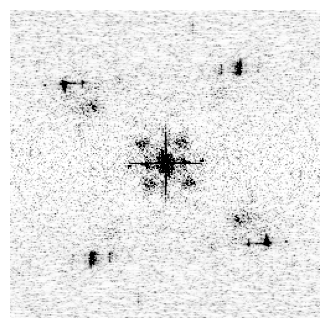

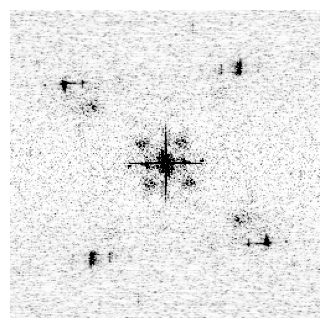

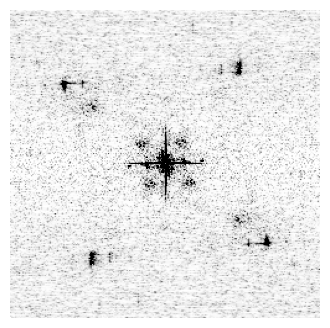

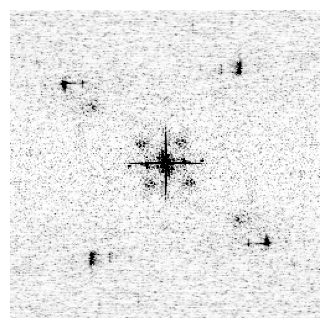

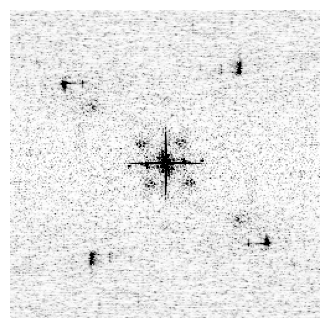

In [138]:
for i in range(len(rec_ft_lasso)-1):
    dfc.quick_plot(rec_ft_lasso[i], rspace=False, imgName='LASSO ft {}'.format(cutoffs_lasso[i]))

### Plot together

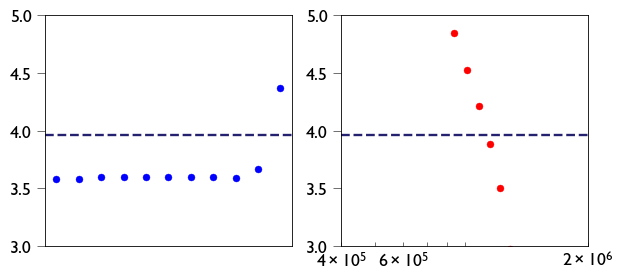

In [153]:
fig, ax=subplots(1,2,figsize=[7,3])
ax[0].plot(array(cutoffs_bpdn)[:-2], snr_bpdn[:-1], 'bo')
ax[1].plot(cutoffs_lasso, snr_lasso[:-1], 'ro')
# axhline(snr_lasso[-1], linestyle='--')
ax[0].axhline(snr_bpdn[-1], linestyle='--')
ax[1].axhline(snr_bpdn[-1], linestyle='--')
ax[0].set_xscale('log')
ax[1].set_xscale('log')
ax[0].set_ylim(3, 5)
ax[1].set_ylim(3, 5)
ax[1].set_xlim(4e5, 2e6)
ax[0].set_xticks([])
ax[1].set_xticks([])

savefig('snr comparison together.png', dpi=400, bbox_inches='tight', pad_inches=0.1)

# Drift correction test

## Drifting field before reconstruction


In [253]:
std(z)*6*1e12

28.73931948922138

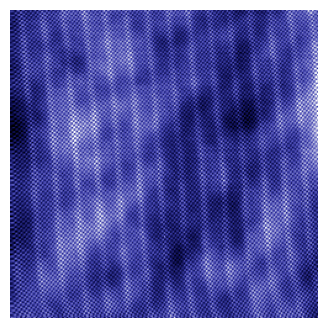

In [254]:
z = st.lineSubtract(d1_true.Z, 2)
dfc.quick_plot(z, imgName="bscco 40 nm topo span 28.74 pm")

The coordinates of the Bragg peaks are:
array([[207,  60],
       [ 43, 190],
       [ 66,  51],
       [184, 199]])

The coordinates of the Q vectors are:
array([[ 83, -64],
       [-81,  66],
       [-58, -73],
       [ 60,  75]])


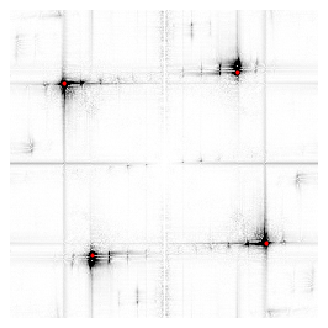

In [293]:
bp = dfc.findBraggs(z, r=0.2, min_dist=20, show=True)

axis('off')
gca().set_aspect(1)

savefig('topo ft to find bp.png', dpi=400, bbox_inches='tight', pad_inches=0)

In [259]:
bpc1 = dfc.generate_bp(z, bp, orient=None)
print(bp, bpc1)

[[207  60]
 [ 43 190]
 [ 66  51]
 [184 199]] [[ 63  47]
 [ 47 185]
 [185 201]
 [201  63]]


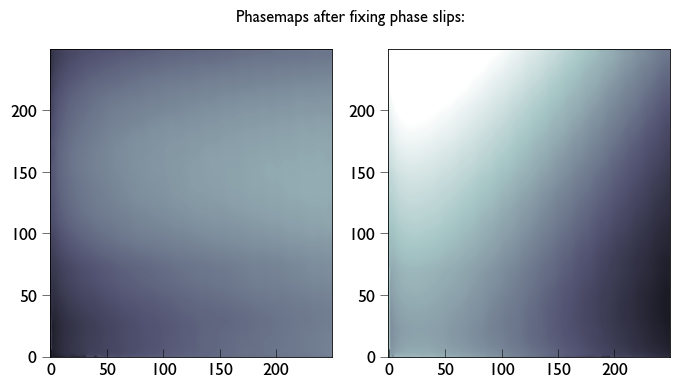

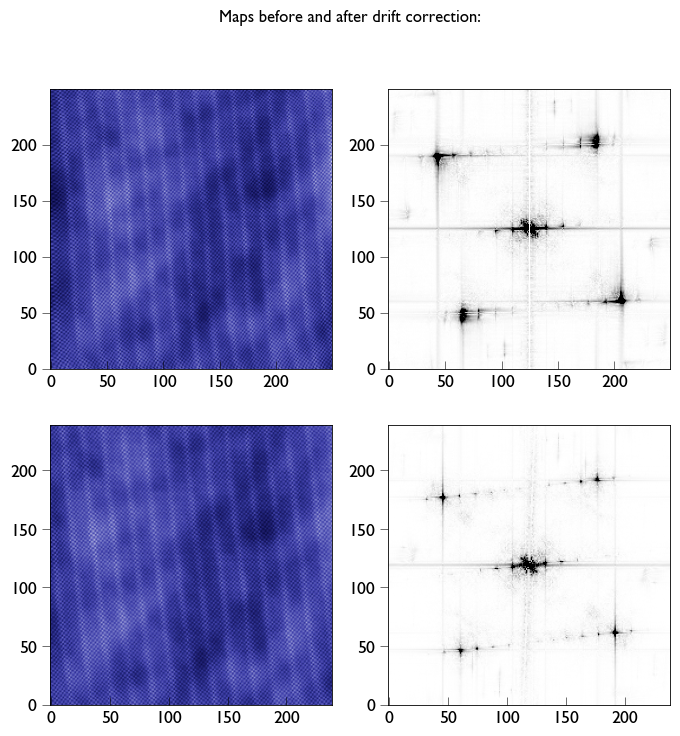

In [262]:
z1_before, p1_before = dfc.find_drift_parameter(z, bp_c=bpc1, sigma=13, cut2=[11,0,11,0], 
                                                show=True)

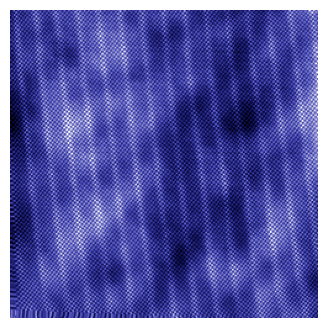

In [261]:
# dfc.quick_plot(z1_before, imgName="bscco 40 nm topo 1st dfc span 28.74 pm")

The coordinates of the Bragg peaks are:
array([[ 61,  46],
       [177, 192],
       [192,  61],
       [ 46, 177]])

The coordinates of the Q vectors are:
array([[-58, -73],
       [ 58,  73],
       [ 73, -58],
       [-73,  58]])


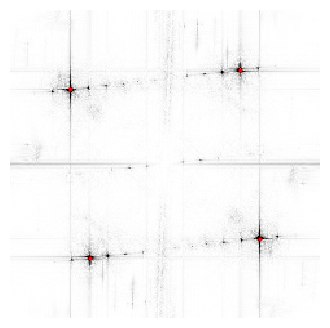

In [294]:
bp2 = dfc.findBraggs(z1_before, r=0.2, min_dist=20, show=True)
axis('off')
savefig('topo ft to find 2nd bp.png', dpi=400, bbox_inches='tight', pad_inches=0)

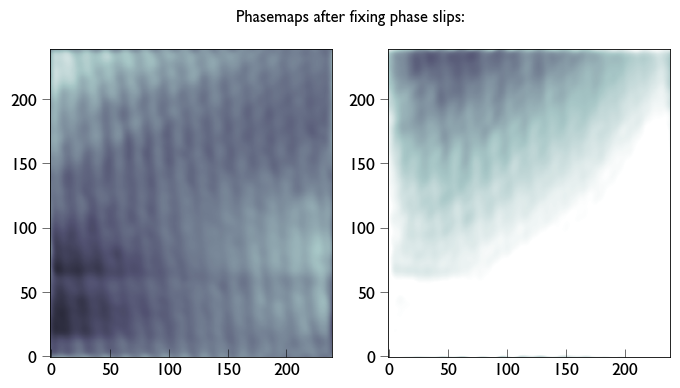

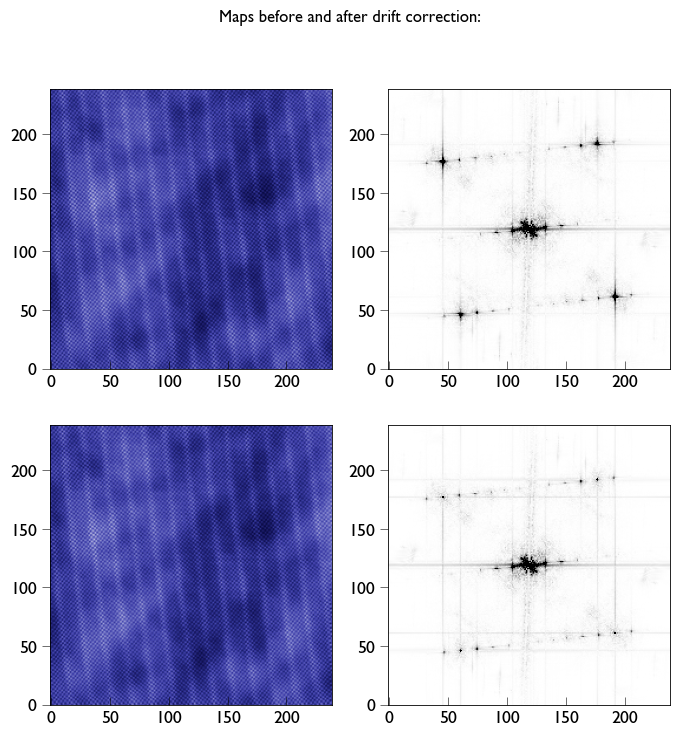

In [264]:
z2_before, p2_before = dfc.find_drift_parameter(z1_before, bp_c=bp2, sigma=13, show=True)

In [274]:
std(st.fft(z2_before, zeroDC=True))*5

4.996537299821155e-09

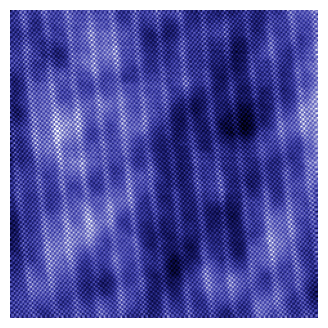

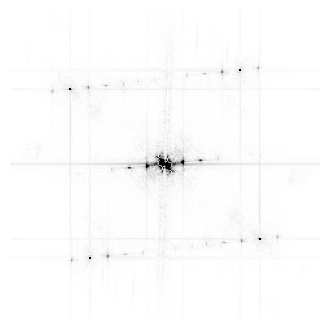

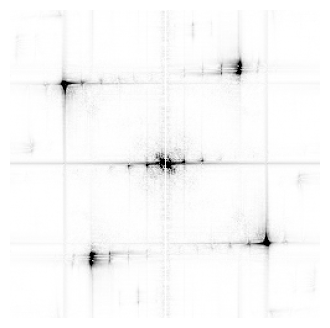

In [280]:
dfc.quick_plot(z2_before, imgName="bscco 40 nm topo 2nd dfc span 25.39 pm")
quick_plot(st.fft(z2_before, zeroDC=True), rspace=False, clims=[0,10e-9], imgName="bscco 40 nm topo ft 2nd dfc span 25.39 pm")
quick_plot(st.fft(z, zeroDC=True), rspace=False, clims=[0,10e-9], imgName="bscco 40 nm topo ft no dfc span 25.39 pm")

In [281]:
p2_before.keys()

dict_keys(['cut1', 'cut2', 'r', 'w', 'mask3', 'sigma', 'method', 'even_out', 'bp_c', 'bp_angle', 'orient', 'bp1', 'phix', 'phiy', 'ux', 'uy'])

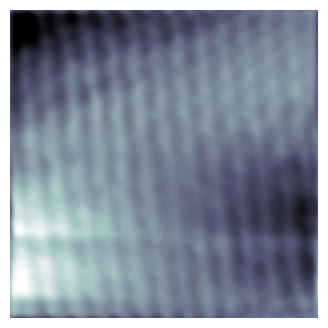

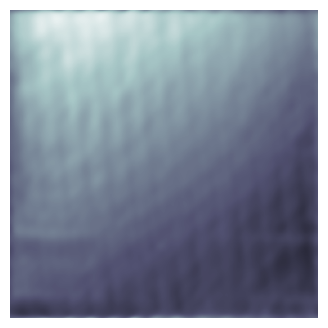

In [283]:
dfc.quick_plot(p2_before['phix'], cmap=stmpy.cm.bone, imgName="bscco 40 nm topo 2nd dfc phasemapx")
dfc.quick_plot(p2_before['phiy'], cmap=stmpy.cm.bone, imgName="bscco 40 nm topo 2nd dfc phasemapy")


In [265]:
p2_before.keys()

dict_keys(['cut1', 'cut2', 'r', 'w', 'mask3', 'sigma', 'method', 'even_out', 'bp_c', 'bp_angle', 'orient', 'bp1', 'phix', 'phiy', 'ux', 'uy'])

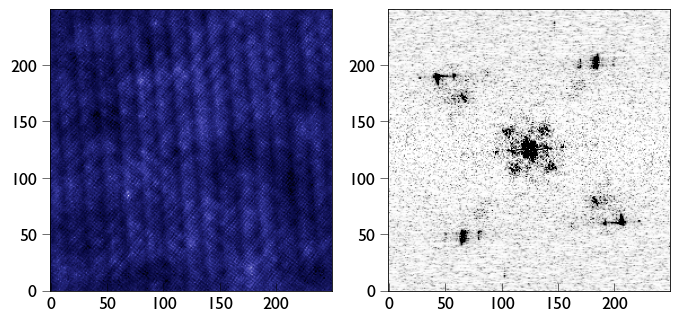

In [269]:
z_rec = copy(test_rec_bpdn[3])
dfc.display(z_rec)

In [270]:
z_temp = dfc.apply_drift_parameter(z_rec, p1_before)

z_rec_before = dfc.apply_drift_parameter(z_temp, p2_before)

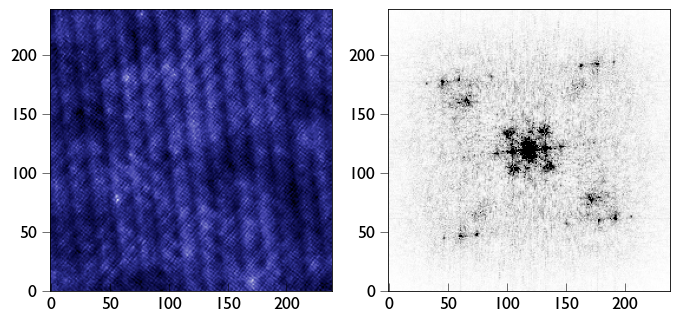

In [271]:
dfc.display(z_rec_before)

In [277]:
def quick_plot(A, rspace=True, thres=3, fs=4, qscale=None, qlimit=1.2,  clims=None, cmap=None,
                      saveon=False, imgName=None, extension='png', dpi=400, **kwargs):
    
    '''
    Display 2D real space and FT images with a set of standard settings.
    
    Inputs:
        A           - Required : 2D arrays of real space or FT image to dispaly
        rspace      - Optional : bool, flag to indicate if A is a real space or FT image
        thres       - Optional : float, number of sigma to control the color limit
        fs          - Optional : float, figure size 
        qscale      - Optional : float, specify the extent for the FT image
        qlimit      - Optional : float, specify the range to plot for the FT image
        clims       - Optional : list, specify the color limit for imshow. If not give, clims will be computed based on mean and std of A.
        imgName     - Optional : String, default None. If not None image will be saved with the name imgName
        kwargs      - Optional : key word arguments used in imshow()
    Returns:
        No return 

    Usage:
        import stmpy
        import stmpy.driftcorr as dfc
        dfc.quick_plot(d.z)
        d.z_ft = stmpy.tools.fft(d.z, zeroDC=True)
        dfc.quick_plot(d.z_ft, rspace=False)

    History:
        05/25/2023        RL : Initial commit.
    '''
    
    plt.figure(figsize=[fs, fs])
    c = np.mean(A)
    s = np.std(A)
    
    # compute the color limit if clims is not given
    if clims == None:
        if rspace == True:
            clims = [c-thres*s, c+thres*s]
        else:
            clims = [0, c+thres*s]
    
    # compute the FT image qscale if qscale is not given
    if qscale == None:
        extents = None
    else:
        extents = [-qscale, qscale, -qscale, qscale, ]
        
    # Use the default color maps if cmap is not set
    if cmap == None:
        cmap = stmpy.cm.blue2 if rspace else stmpy.cm.gray_r
        
    if rspace == True:
        plt.imshow(A, clim=clims, cmap=cmap, **kwargs)
        plt.gca().set_aspect(1)
    else:
        plt.imshow(A, extent=extents, clim=clims, cmap=cmap, **kwargs)
    plt.gca().axes.get_xaxis().set_visible(False)
    plt.gca().axes.get_yaxis().set_visible(False)
    plt.gca().set_frame_on(False)
    
    if imgName != None:
        if extension == 'png':
            plt.savefig("{}.{}".format(imgName, extension), dpi=dpi, bbox_inches='tight', pad_inches=0)
        else:
            plt.savefig("{}.{}".format(imgName, extension), bbox_inches='tight', pad_inches=0)

## Drifting field after reconstruction

The coordinates of the Bragg peaks are:
array([[207,  60],
       [ 43, 190],
       [ 66,  51],
       [184, 199]])

The coordinates of the Q vectors are:
array([[ 83, -64],
       [-81,  66],
       [-58, -73],
       [ 60,  75]])


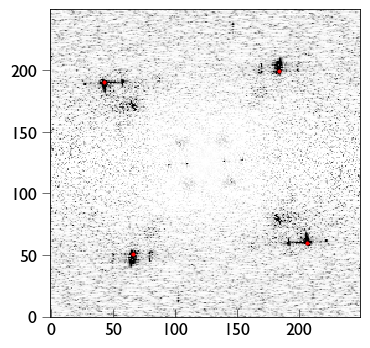

In [223]:
bp1_after = dfc.findBraggs(z_rec, r=0.2, min_dist=20, show=True)

In [224]:
bpc1_after = dfc.generate_bp(z_rec, bp1_after, orient=None)
bpc1_after

array([[ 63,  47],
       [ 47, 185],
       [185, 201],
       [201,  63]])

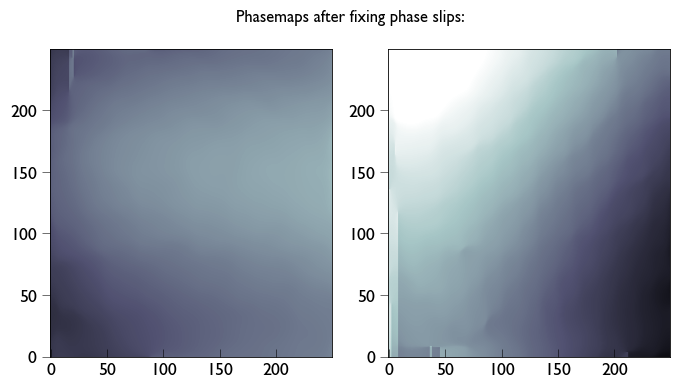

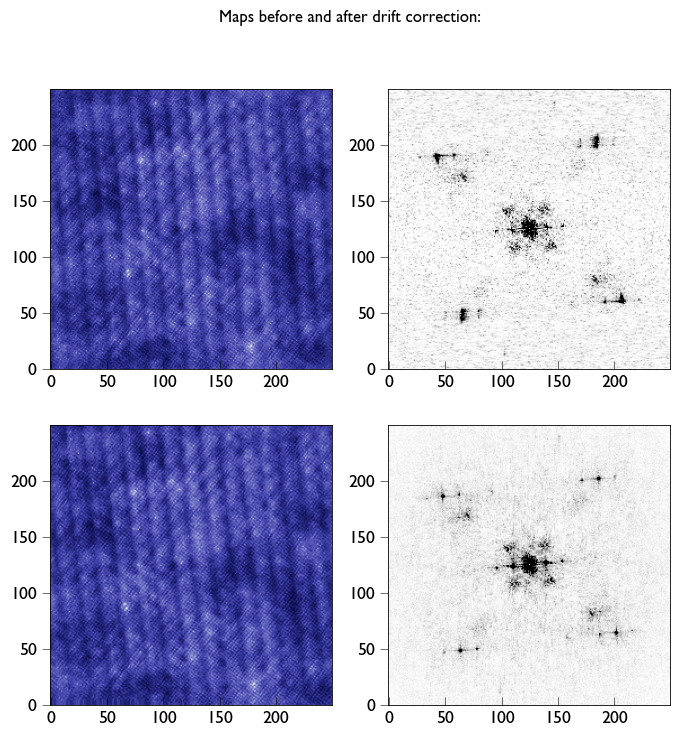

In [255]:
z1_after, p1_after = dfc.find_drift_parameter(z_rec, bp_c=bpc1_after, sigma=6,# cut2=[21,0,21,0],
                                              show=True)

The coordinates of the Bragg peaks are:
array([[ 45, 169],
       [183,  59],
       [169, 184],
       [ 59,  44]])

The coordinates of the Q vectors are:
array([[-69,  55],
       [ 69, -55],
       [ 55,  70],
       [-55, -70]])


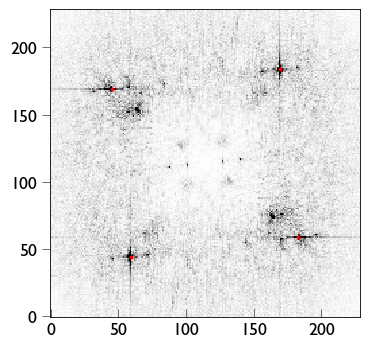

In [243]:
bp2 = dfc.findBraggs(z1_after, r=0.2, min_dist=20, show=True)

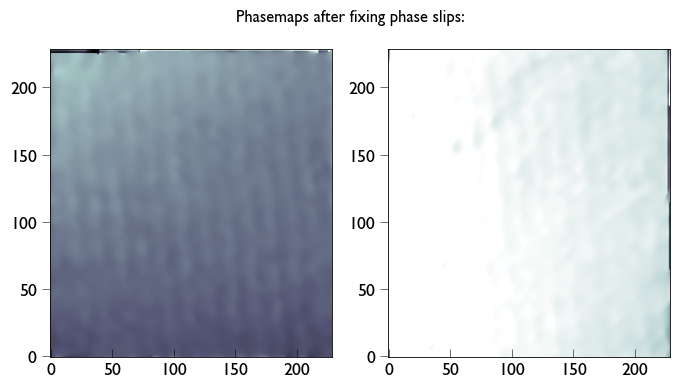

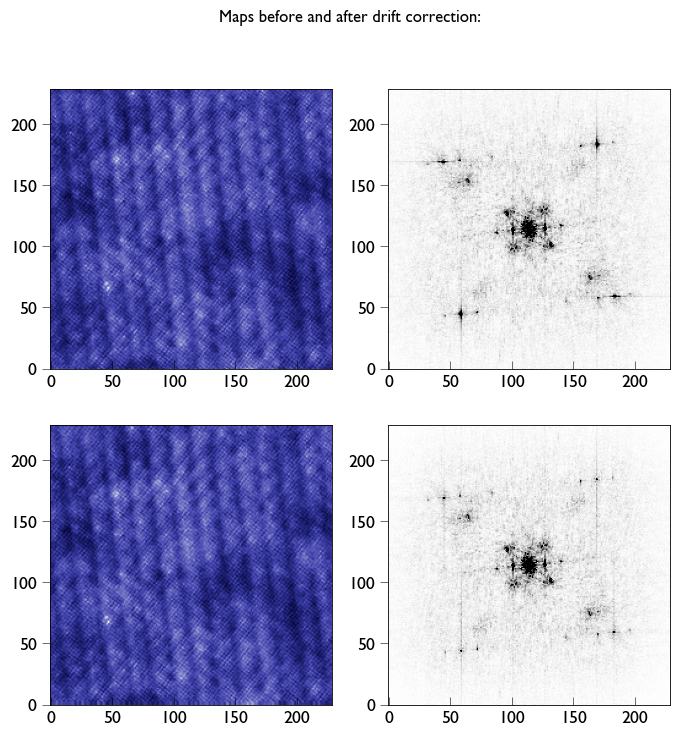

In [244]:
z2_after, p2_after = dfc.find_drift_parameter(z1_after, bp_c=bp2, sigma=10, show=True)

### Compare the two drift corrected images

The coordinates of the Bragg peaks are:
array([[183,  59],
       [ 45, 169],
       [ 59,  45],
       [169, 183]])

The coordinates of the Q vectors are:
array([[ 69, -55],
       [-69,  55],
       [-55, -69],
       [ 55,  69]])


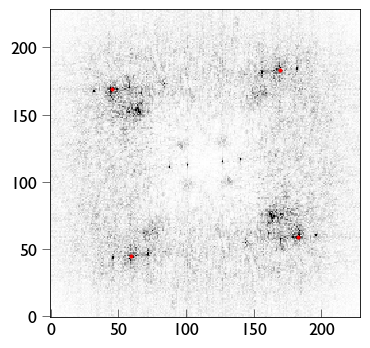

In [246]:
bpx = dfc.findBraggs(z_rec_before, r=0.2, min_dist=20, show=True)

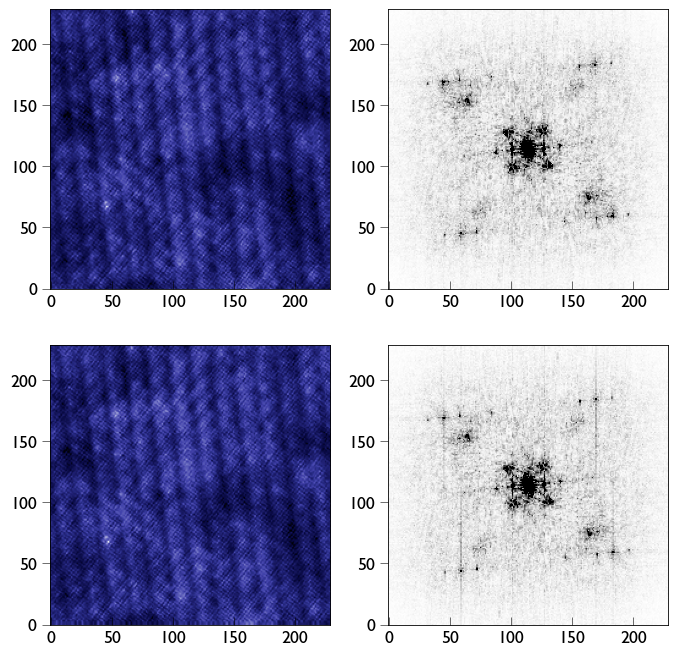

In [247]:
dfc.display(z_rec_before, z2_after)

In [248]:
z2_before_ft = st.fft(z_rec_before, zeroDC=True)
z2_after_ft = st.fft(z2_after, zeroDC=True)

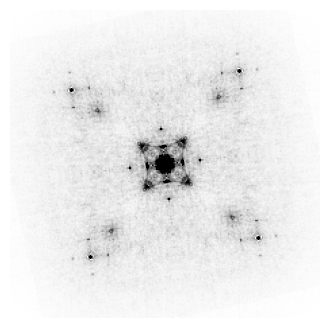

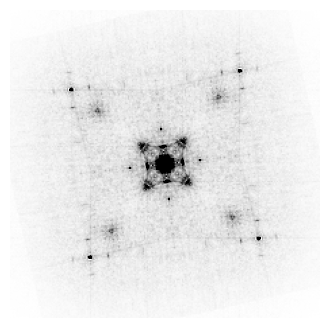

In [251]:
dfc.quick_plot(st.symmetrize(z2_before_ft, n=4, bp=bpx[0], mirrorOnly=False), thres=5, rspace=False)
dfc.quick_plot(st.symmetrize(z2_after_ft, n=4, bp=bpx[0], mirrorOnly=False), thres=5, rspace=False)